In [1]:
%load_ext autoreload
%autoreload 2

import ncem

datadir = "/Users/anna.schaar/phd/datasets"

# Load data

In [2]:
interpreter = ncem.interpretation.interpreter.InterpreterGraph()
interpreter.get_data(
    data_path=datadir + '/lohoff/',
    data_origin='lohoff',
    radius=10,
    node_label_space_id='type',
    node_feature_space_id='standard',
)
print('\n Celldata metadata:', interpreter.data.celldata.uns['metadata'])

Loading data from raw files
registering celldata


  0%|          | 0/3 [00:00<?, ?it/s]

collecting image-wise celldata
adding graph-level covariates


100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

Loaded 3 images with complete data from 3 patients over 57101 cells with 387 cell features and 24 distinct celltypes.
Mean of mean node degree per images across images: 196.309272

 Celldata metadata: {'lateral_resolution': 1.0, 'fn': 'preprocessed_lohoff.h5ad', 'image_col': 'embryo', 'pos_cols': ['x_global', 'y_global'], 'cluster_col': 'celltype_mapped_refined', 'cluster_col_preprocessed': 'celltype_mapped_refined', 'patient_col': 'embryo'}


# Supp. Fig. 1: Cell-type centric summary statistics in seqFISH dataset.

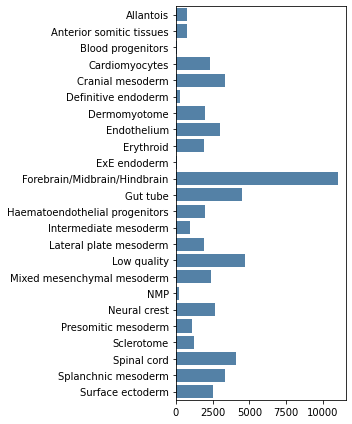

In [3]:
interpreter.data.celltype_frequencies()

0.0
9.956591091981958
55.96318560684438
197.30927232664524
670.382296230292
2188.154089430536
6281.175650627664
14717.45521028367
19033.666666666668


/Users/anna.schaar/opt/miniconda3/envs/ncem/lib/python3.8/site-packages/ncem/data.py:192: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  ax.set_yscale("log", basey=10)


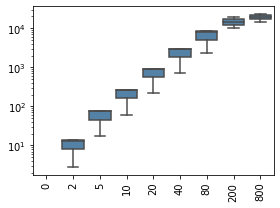

In [4]:
interpreter.data.plot_degree_vs_dist(
    max_distances=[0, 2, 5, 10, 20, 40, 80, 200, 800],
)

# Supp. Fig. 2: Variance decomposition in seqFISH dataset.

100%|██████████| 3/3 [00:38<00:00, 12.92s/it]


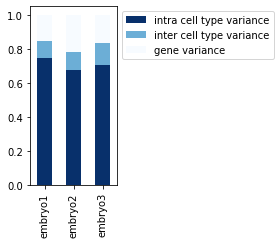

In [20]:
var_decomp = interpreter.data.compute_variance_decomposition()
interpreter.data.variance_decomposition(
    var_decomp, figsize=(4.,3.5)
)

In [21]:
var_decomp.mean(axis=0)[['intra cell type variance', 'inter cell type variance', 'gene variance']]

intra cell type variance    0.711176
inter cell type variance    0.109479
gene variance               0.179345
dtype: float32

# Supp. Fig. 6: Normalised contact frequencies of cell-types in spatial neighborhoods

100%|██████████| 3/3 [01:38<00:00, 32.93s/it]


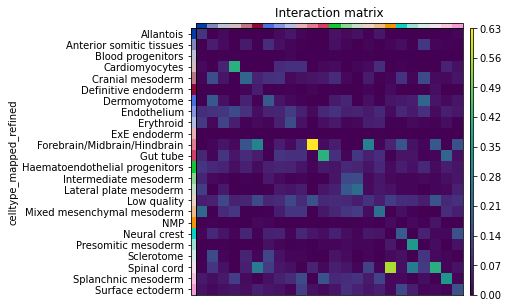

In [22]:
interpreter.data.celldata_interaction_matrix(figsize=(4,4))

# Supp. Fig. 7: Ligand–receptor permutation test.

n cells: 5753


  0%|          | 0/1000 [00:00<?, ?permutation/s]

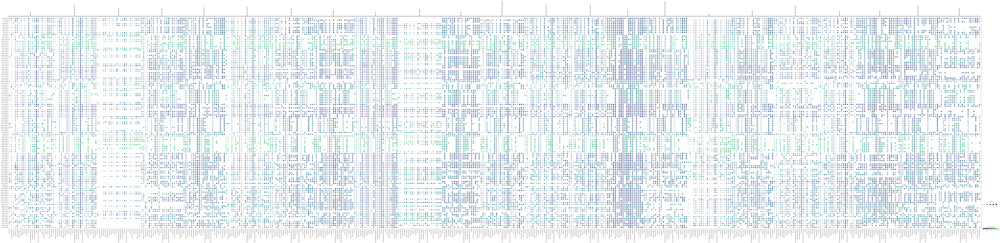

In [6]:
adata = interpreter.data.ligrec(
    fraction=0.1
)

# Supp. Fig. 8: Attributing cell heterogeneity to niche composition.

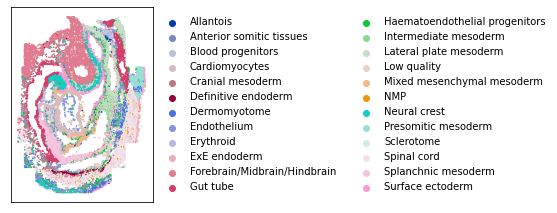

In [8]:
interpreter.data.spatial(image_key= "embryo1", spot_size=2, copy=False)

         Falling back to preprocessing with `sc.pp.pca` and default params.


n cells:  736
Cardiomyocytes 0    268
Cardiomyocytes 1    176
Cardiomyocytes 2    102
Cardiomyocytes 3     90
Cardiomyocytes 4     58
Cardiomyocytes 5     42
Name: Cardiomyocytes substates, dtype: int64


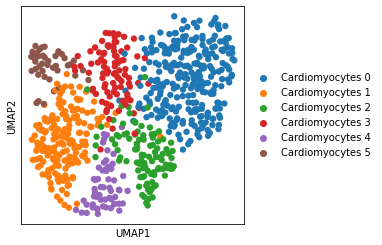

In [50]:
adata = interpreter.data.umap(
    image_key= "embryo1",
    target_cell_type='Cardiomyocytes',
    n_neighbors=30,
    n_pcs=50,
    #palette='tab10'
)

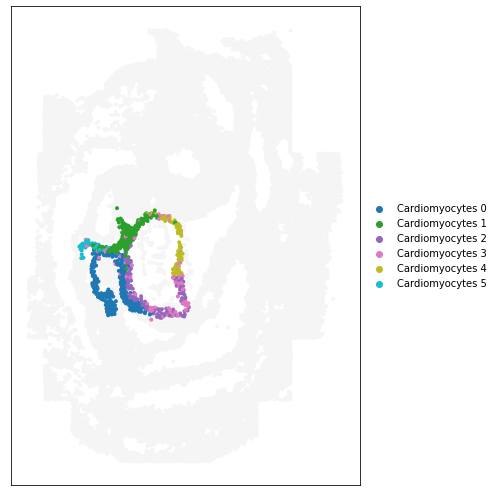

In [51]:
interpreter.data.spatial_substates(
    adata,
    image_key= "embryo1",
    target_cell_type='Cardiomyocytes',
    spot_size=2
)

In [52]:
adata_img, adata, log_pval, fold_change = interpreter.data.compute_cluster_enrichment(
    image_key=['embryo1'],
    target_cell_type='Cardiomyocytes',
    clip_pvalues=-5,
    n_neighbors=30,
    n_pcs=50,
    #filter_titles=filter_titles
)

 17%|█▋        | 5/30 [00:30<02:18,  5.54s/it]WARNING: You’re trying to run this on 387 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
100%|██████████| 30/30 [00:35<00:00,  1.20s/it]

n cells:  736
Cardiomyocytes 0    268
Cardiomyocytes 1    176
Cardiomyocytes 2    102
Cardiomyocytes 3     90
Cardiomyocytes 4     58
Cardiomyocytes 5     42
Name: Cardiomyocytes substates, dtype: int64


In [41]:
filter_titles = list(adata_img.uns['node_type_names'].values())

... storing 'embryo' as categorical
... storing 'pos' as categorical
... storing 'embryo_pos' as categorical
... storing 'embryo_pos_z' as categorical


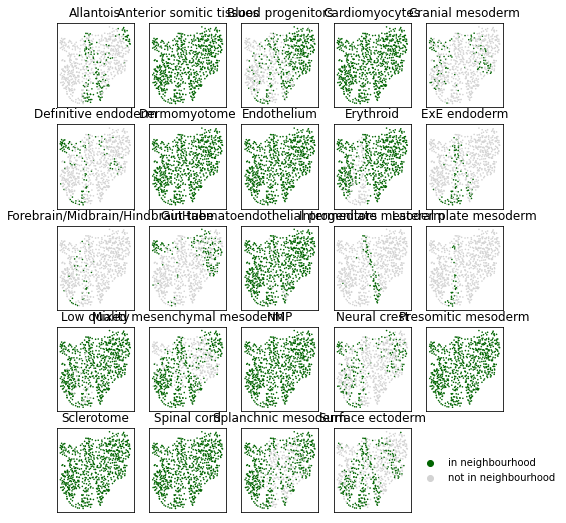

In [53]:
interpreter.data.umaps_cluster_enrichment(
    adata,
    nrows=5,
    ncols=5,
    figsize=(8,9),
    filter_titles=filter_titles,
    size=10
)

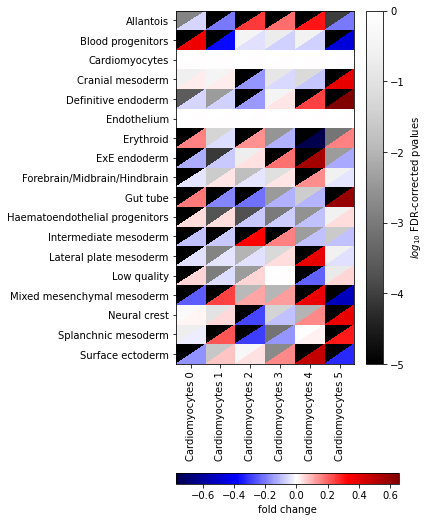

In [69]:
interpreter.data.cluster_enrichment(
    pvalues=log_pval.filter(list(fold_change.index), axis=0),
    fold_change=fold_change,
    pad=0.2,
)